# Fused real-data reconstruction figure

This notebook fuses the information previously shown in real-data Figures 10, 8, and 9 into a single figure with the same logical ordering used for the fused synthetic-data figure.

The final figure contains:

1. vertical perturbation profile $\delta N_{e,z}$ and temporal perturbation profile $\delta N_{e,t}$;
2. reconstructed physical backgrounds $h'(\chi)$ and $\beta(\chi)$;
3. reconstructed background amplitude and phase at RX (17 original 15-minute points);
4. reconstructed perturbed amplitude and phase at RX (49 points at 5-minute cadence), together with corrected real data;
5. the Whittaker $\log_{10}(N_e)$ realization at Punta Lobos and its physical reflection-height curve.

The three reconstruction families are **ASLS**, **Whittaker**, and **Polynomial**. No family is treated as a known truth. The perturbation legends include the total normalized $\chi^2$ used in the original Figure 9. An explicit audit cell verifies that the recomputed values and the rounded legend values reproduce the original Figure 9 values.

No inversion and no LMP forward propagation are rerun by this notebook; it reads the final stored reconstruction products used by the original figures.


In [1]:

# ============================================================
# 1. Packages and project functions
# ============================================================
using HDF5
using Dates
using TimeZones
using AstroLib
using Polynomials
using Interpolations
using LongwaveModePropagator
using CairoMakie
using LaTeXStrings
using DataFrames
using Printf
using Statistics

CairoMakie.activate!()

PROJECT_ROOT_LOCAL = isdefined(Main, :PROJECT_ROOT) ? PROJECT_ROOT : pwd()
preamble_path = joinpath(PROJECT_ROOT_LOCAL, "mytools", "preamble.jl")

if (!isdefined(Main, :waitprofile) || !isdefined(Main, :geolinspace)) && isfile(preamble_path)
    include(preamble_path)
end

@assert isdefined(Main, :waitprofile) "No encuentro `waitprofile`. Revisa PROJECT_ROOT o mytools/preamble.jl."
@assert isdefined(Main, :geolinspace) "No encuentro `geolinspace`. Revisa PROJECT_ROOT o mytools/preamble.jl."

FS_TICK   = 22
FS_LABEL  = 26
FS_TITLE  = 29
FS_LEGEND = 21
LW        = 4.0

METHOD_NAMES = ["ASLS", "Whittaker", "Polynomial"]
METHOD_COLORS = [:dodgerblue3, :darkgreen, :red3]
METHOD_LINESTYLES = [:dashdot, :dot, :solid]


METHOD_MARKERS = [:rect, :diamond, :circle]


[ Info: Loading CHAOS-7.11.mat


3-element Vector{Symbol}:
 :rect
 :diamond
 :circle

In [2]:
# ============================================================
# 2. Canonical input files and output names
# ============================================================
function find_existing_file(
    name_or_path::AbstractString;
    env_name::AbstractString = "",
    extra_dirs::Vector{String} = String[],
)
    override = isempty(env_name) ? "" : strip(get(ENV, env_name, ""))
    requested = isempty(override) ? String(name_or_path) : override
    fname = basename(requested)

    roots = unique(vcat(
        [pwd(), PROJECT_ROOT_LOCAL, "/home/jp/basefolder_JP", "/mnt/data"],
        extra_dirs,
    ))

    candidates = String[
        requested,
        joinpath(pwd(), requested),
        joinpath(PROJECT_ROOT_LOCAL, requested),
    ]
    for root in roots
        isempty(root) || push!(candidates, joinpath(root, fname))
        isempty(root) || push!(candidates, joinpath(root, "series_5min_FIXED_TPK", fname))
    end

    for path in unique(candidates)
        isfile(path) && return abspath(path)
    end

    for root in roots
        isdir(root) || continue
        for (dir, _subdirs, files) in walkdir(root)
            if fname in files
                return abspath(joinpath(dir, fname))
            end
        end
    end

    error(
        "No encontré el archivo $(requested). " *
        (isempty(env_name) ? "" : "También puedes definir ENV[\"$(env_name)\"]."),
    )
end

OLD_BG_H5 = find_existing_file(
    "new-real-background-inversion-bbo_from_old_asls_restart_results_13341497.h5";
    env_name = "OLD_BG_H5",
)

WHIT_BG_H5 = find_existing_file(
    "new-real-background-inversion_from_sep_16_22_restart15_results_12976567.h5";
    env_name = "WHIT_BG_H5",
)

POLY_BG_H5 = find_existing_file(
    "new-real-background-inversion_from_polyF3_simultaneous_restart_from_15706055_results_15742708.h5";
    env_name = "POLY_BG_H5",
)

OLD_SECOND_H5 = find_existing_file(
    "new-perturbation-inversion_F3_nexp_oldASLS_BG13341497_FIXED_TPK_rel10_seed_from_15341092_results_15373069.h5";
    env_name = "OLD_SECOND_H5",
)

WHIT_SECOND_H5 = find_existing_file(
    "new-perturbation-inversion_F3_nexp_whittakerBG12976567_FIXED_TPK_restart_from15517278_rel10_z0wide20_results_15572093.h5";
    env_name = "WHIT_SECOND_H5",
)

POLY_SECOND_H5 = find_existing_file(
    "new-perturbation-inversion_F3_nexp_polyF3BG15742708_FIXED_TPK_restart_from_15824988_rel10_results_15868514.h5";
    env_name = "POLY_SECOND_H5",
)

OLD_WHIT_5MIN_H5 = find_existing_file(
    "series_5min_seed_oldASLSbest_whittakerbest_FIXED_TPK.h5";
    env_name = "OLD_WHIT_5MIN_H5",
)

POLY_5MIN_H5 = find_existing_file(
    "perturbation_polyF3BG15742708_seed_BBO1_15824988_BBO2_15868514_timeseries_5min.h5";
    env_name = "POLY_5MIN_H5",
)

BG_PATHS = [OLD_BG_H5, WHIT_BG_H5, POLY_BG_H5]
PERT_PATHS = [OLD_SECOND_H5, WHIT_SECOND_H5, POLY_SECOND_H5]

OUTDIR = joinpath(pwd(), "real_3families_fused_figure")
mkpath(OUTDIR)

output_pdf = joinpath(OUTDIR, "real-data-fused-background-perturbation-physical-reconstruction.pdf")
output_png = joinpath(OUTDIR, "real-data-fused-background-perturbation-physical-reconstruction.png")

input_paths = DataFrame(
    item = [
        "OLD_BG_H5", "WHIT_BG_H5", "POLY_BG_H5",
        "OLD_SECOND_H5", "WHIT_SECOND_H5", "POLY_SECOND_H5",
        "OLD_WHIT_5MIN_H5", "POLY_5MIN_H5",
    ],
    path = [
        OLD_BG_H5, WHIT_BG_H5, POLY_BG_H5,
        OLD_SECOND_H5, WHIT_SECOND_H5, POLY_SECOND_H5,
        OLD_WHIT_5MIN_H5, POLY_5MIN_H5,
    ],
)

display(input_paths)
println("Output PDF: ", output_pdf)


Row,item,path
,String,String
1,OLD_BG_H5,/home/jp/basefolder_JP/new-real-background-inversion-bbo_from_old_asls_restart_results_13341497.h5
2,WHIT_BG_H5,/home/jp/basefolder_JP/new-real-background-inversion_from_sep_16_22_restart15_results_12976567.h5
3,POLY_BG_H5,/home/jp/basefolder_JP/new-real-background-inversion_from_polyF3_simultaneous_restart_from_15706055_results_15742708.h5
4,OLD_SECOND_H5,/home/jp/basefolder_JP/new-perturbation-inversion_F3_nexp_oldASLS_BG13341497_FIXED_TPK_rel10_seed_from_15341092_results_15373069.h5
5,WHIT_SECOND_H5,/home/jp/basefolder_JP/new-perturbation-inversion_F3_nexp_whittakerBG12976567_FIXED_TPK_restart_from15517278_rel10_z0wide20_results_15572093.h5
6,POLY_SECOND_H5,/home/jp/basefolder_JP/new-perturbation-inversion_F3_nexp_polyF3BG15742708_FIXED_TPK_restart_from_15824988_rel10_results_15868514.h5
7,OLD_WHIT_5MIN_H5,/home/jp/basefolder_JP/series_5min_FIXED_TPK/series_5min_seed_oldASLSbest_whittakerbest_FIXED_TPK.h5
8,POLY_5MIN_H5,/home/jp/basefolder_JP/perturbation_polyF3BG15742708_seed_BBO1_15824988_BBO2_15868514_timeseries_5min.h5


Output PDF: /home/jp/basefolder_JP/real_3families_fused_figure/real-data-fused-background-perturbation-physical-reconstruction.pdf


In [3]:

# ============================================================
# 3. HDF5 readers and parameter loaders
# ============================================================
function h5exists(path::AbstractString, key::AbstractString)
    h5open(path, "r") do f
        return haskey(f, key)
    end
end

function readvec(path::AbstractString, key::AbstractString)
    h5open(path, "r") do f
        return Float64.(vec(read(f[key])))
    end
end

function clean_h5_string(x)
    if x === nothing || x === missing
        return ""
    elseif x isa AbstractString
        return replace(String(x), "\0" => "")
    elseif x isa AbstractArray{UInt8}
        return replace(String(vec(x)), "\0" => "")
    elseif x isa AbstractArray && length(x) == 1
        return clean_h5_string(first(x))
    else
        return replace(string(x), "\0" => "")
    end
end

function read_attr_raw(path::AbstractString, key::AbstractString; default = nothing)
    h5open(path, "r") do f
        attrs = HDF5.attributes(f)
        return haskey(attrs, key) ? read(attrs[key]) : default
    end
end

attr_string(path::AbstractString, key::AbstractString; default = "") =
    clean_h5_string(read_attr_raw(path, key; default = default))

function attr_float(path::AbstractString, key::AbstractString; default = NaN)
    value = read_attr_raw(path, key; default = default)
    value isa AbstractArray && length(value) == 1 && (value = first(value))

    try
        return Float64(value)
    catch
        try
            return parse(Float64, clean_h5_string(value))
        catch
            return default
        end
    end
end

function first_existing_vector(
    path::AbstractString,
    keys::Vector{String};
    required::Bool = true,
)
    for key in keys
        if h5exists(path, key)
            return readvec(path, key), key
        end
    end

    required && error(
        "No encontré ninguna de estas llaves en $(basename(path)):\n" * join(keys, "\n"),
    )
    return nothing, ""
end

function load_background_parameters(path::AbstractString, label::AbstractString)
    h, h_key = first_existing_vector(
        path,
        [
            "reconstruction/h_coeffs",
            "reconstruction/hprime_coeffs",
            "best/h_coeffs",
            "h_coeffs",
        ];
        required = false,
    )

    beta, beta_key = first_existing_vector(
        path,
        [
            "reconstruction/beta_coeffs",
            "best/beta_coeffs",
            "beta_coeffs",
        ];
        required = false,
    )

    combined_key = ""
    if h === nothing || beta === nothing
        params, combined_key = first_existing_vector(
            path,
            [
                "reconstruction/params",
                "reconstruction/reco_params",
                "reconstruction/best_params",
                "reco_params",
                "best_params",
            ],
        )
        length(params) == 15 || error(
            "El vector combinado del background $(label) debe tener 15 parámetros; tiene $(length(params)).",
        )
        h = params[1:9]
        beta = params[10:15]
        h_key = combined_key * "[1:9]"
        beta_key = combined_key * "[10:15]"
    end

    length(h) == 9 || error("$(label): se esperaban 9 coeficientes para h′.")
    length(beta) == 6 || error("$(label): se esperaban 6 coeficientes para β.")
    all(isfinite, vcat(h, beta)) || error("$(label): hay coeficientes no finitos.")

    return (
        label = label,
        path = path,
        h_coeffs = Float64.(h),
        beta_coeffs = Float64.(beta),
        h_key = h_key,
        beta_key = beta_key,
    )
end

function load_perturbation_parameters(path::AbstractString, label::AbstractString)
    params, params_key = first_existing_vector(
        path,
        [
            "reconstruction/full_params",
            "reconstruction/params",
            "reconstruction/reco_params",
            "reco_params",
            "best_params",
        ],
    )

    t_pk_fixed_s = attr_float(path, "t_pk_fixed_s"; default = NaN)
    if !isfinite(t_pk_fixed_s) && h5exists(path, "fixed/t_pk_s")
        t_pk_fixed_s = first(readvec(path, "fixed/t_pk_s"))
    end

    if length(params) == 7
        amp, t_pk_from_vector, tau_u_s, tau_d_s, eps_s, z0_km, hz_km = params
        if isfinite(t_pk_fixed_s)
            isapprox(t_pk_from_vector, t_pk_fixed_s; atol = 1e-8, rtol = 0.0) || error(
                "$(label): t_pk del vector no coincide con el t_pk fijo del archivo.",
            )
        else
            t_pk_fixed_s = t_pk_from_vector
        end
    elseif length(params) == 6
        amp, tau_u_s, tau_d_s, eps_s, z0_km, hz_km = params
        isfinite(t_pk_fixed_s) || error(
            "$(label): el vector tiene 6 parámetros, pero no pude leer t_pk_fixed_s.",
        )
    else
        error(
            "$(label): esperaba 6 parámetros libres o 7 parámetros completos; encontré $(length(params)).",
        )
    end

    values = [amp, t_pk_fixed_s, tau_u_s, tau_d_s, eps_s, z0_km, hz_km]
    all(isfinite, values) || error("$(label): hay parámetros de perturbación no finitos.")
    minimum([amp, tau_u_s, tau_d_s, eps_s, hz_km]) > 0.0 || error(
        "$(label): hay escalas físicas no positivas.",
    )

    return (
        label = label,
        path = path,
        params_key = params_key,
        amp = amp,
        t_pk_s = t_pk_fixed_s,
        tau_u_s = tau_u_s,
        tau_d_s = tau_d_s,
        eps_s = eps_s,
        z0_km = z0_km,
        hz_km = hz_km,
        t_pk_fixed_utc = attr_string(path, "t_pk_fixed_utc"; default = ""),
        background_source_h5 = attr_string(path, "background_source_h5"; default = ""),
    )
end


load_perturbation_parameters (generic function with 1 method)

In [4]:
# ============================================================
# 4. Time alignment and goodness-of-fit utilities
# ============================================================
function read_any(path::AbstractString, key::AbstractString)
    h5open(path, "r") do f
        return read(f[key])
    end
end

function read_string_vector(path::AbstractString, key::AbstractString)
    x = read_any(path, key)

    if x isa AbstractArray{<:AbstractString}
        return String.(vec(x))
    elseif x isa AbstractString
        return filter(s -> !isempty(s), strip.(split(String(x), '\n')))
    elseif x isa AbstractArray{UInt8}
        if ndims(x) == 1
            return filter(s -> !isempty(s), strip.(split(clean_h5_string(x), '\n')))
        elseif size(x, 1) <= size(x, 2)
            return [clean_h5_string(x[:, j]) for j in axes(x, 2)]
        else
            return [clean_h5_string(x[i, :]) for i in axes(x, 1)]
        end
    end

    return clean_h5_string.(vec(x))
end

function normalize_unix(x::AbstractVector)
    u = Float64.(vec(x))
    median(abs.(u)) > 1e12 && (u = u ./ 1000.0)
    return u
end

hour_from_datetime(dt::DateTime) =
    Dates.hour(dt) +
    Dates.minute(dt) / 60 +
    Dates.second(dt) / 3600 +
    Dates.millisecond(dt) / 3.6e6

hour_from_unix(u::AbstractVector) =
    hour_from_datetime.(unix2datetime.(round.(Int, normalize_unix(u))))

function parse_iso_datetime(s::AbstractString)
    ss = strip(String(s))
    ss = replace(ss, "Z" => "")
    ss = replace(ss, r"\+00:00$" => "")
    ss = length(ss) >= 19 ? ss[1:19] : ss
    return DateTime(ss)
end

function time_reference(
    path::AbstractString,
    n::Int;
    fallback_ref_unix = nothing,
)
    unix_keys = [
        "time/timestamps_unix",
        "time/timestamps_unix_used",
        "timestamps",
        "timestamps_unix",
        "time_unix",
        "unix_timestamps",
        "timestamps_unix_used",
        "time_unix_used",
    ]

    for key in unix_keys
        if h5exists(path, key)
            u = normalize_unix(readvec(path, key))
            length(u) == n || continue
            return (unix = u, hours = hour_from_unix(u), source = key)
        end
    end

    iso_keys = [
        "time/timestamps_iso_utc",
        "timestamps_iso",
        "timestamps_iso_utc",
        "time_iso",
        "datetime_iso",
    ]

    for key in iso_keys
        if h5exists(path, key)
            s = read_string_vector(path, key)
            length(s) == n || continue
            u = datetime2unix.(parse_iso_datetime.(s))
            return (unix = Float64.(u), hours = hour_from_unix(u), source = key)
        end
    end

    hour_keys = [
        "time/t_hours",
        "time/t_hours_used",
        "t_hours",
        "t_hours_used",
        "hours",
    ]

    for key in hour_keys
        if h5exists(path, key)
            h = readvec(path, key)
            length(h) == n || continue
            return (unix = nothing, hours = h, source = key)
        end
    end

    if fallback_ref_unix !== nothing && length(fallback_ref_unix) == n
        u = normalize_unix(fallback_ref_unix)
        return (unix = u, hours = hour_from_unix(u), source = "fallback_ref_unix")
    end

    error("No pude reconstruir el eje temporal de $(basename(path)) para N=$(n).")
end

function align_to_reference(
    y::AbstractVector,
    source_time::NamedTuple,
    ref_time::NamedTuple;
    tol_s::Float64 = 1.1,
)
    if source_time.unix !== nothing && ref_time.unix !== nothing
        src = Float64.(source_time.unix)
        ref = Float64.(ref_time.unix)
        tol = tol_s
        unit = "s"
    else
        src = Float64.(source_time.hours)
        ref = Float64.(ref_time.hours)
        tol = tol_s / 3600.0
        unit = "h"
    end

    idx = Vector{Int}(undef, length(ref))
    delta = Vector{Float64}(undef, length(ref))

    for j in eachindex(ref)
        d = abs.(src .- ref[j])
        idx[j] = argmin(d)
        delta[j] = d[idx[j]]
    end

    maximum(delta) <= tol || error(
        "No pude alinear $(length(ref)) puntos. Máxima diferencia=$(maximum(delta)) $(unit).",
    )

    length(unique(idx)) == length(idx) || error(
        "La alineación temporal reutilizó índices de la serie fuente.",
    )

    return Float64.(y[idx]), idx, maximum(delta), unit
end

function chi2_norm(model::AbstractVector, target::AbstractVector)
    den = sum((target .- mean(target)) .^ 2)
    den > 0.0 || error("El target tiene varianza cero.")
    return sum((model .- target) .^ 2) / den
end

rmse(model::AbstractVector, target::AbstractVector) =
    sqrt(mean((model .- target) .^ 2))

function metrics(model_A, model_phi, target_A, target_phi)
    chiA = chi2_norm(model_A, target_A)
    chiP = chi2_norm(model_phi, target_phi)

    return (
        chi2_A = chiA,
        chi2_phi = chiP,
        chi2_total = chiA + chiP,
        RMSE_A_dB = rmse(model_A, target_A),
        RMSE_phi_deg = rmse(model_phi, target_phi),
    )
end


metrics (generic function with 1 method)

In [5]:

# ============================================================
# 4. Load and audit the three reconstruction families
# ============================================================
backgrounds = [
    load_background_parameters(BG_PATHS[i], METHOD_NAMES[i])
    for i in eachindex(METHOD_NAMES)
]

perturbations = [
    load_perturbation_parameters(PERT_PATHS[i], METHOD_NAMES[i])
    for i in eachindex(METHOD_NAMES)
]

for i in eachindex(METHOD_NAMES)
    stored_bg = strip(perturbations[i].background_source_h5)
    if !isempty(stored_bg)
        @assert basename(stored_bg) == basename(backgrounds[i].path) (
            "$(METHOD_NAMES[i]): el background registrado por la segunda inversión " *
            "no coincide con el archivo de background seleccionado."
        )
    end
end

@assert all(
    isapprox(p.t_pk_s, 1800.0; atol = 1e-8, rtol = 0.0)
    for p in perturbations
) "Al menos una familia no usa el t_pk fijo de 1800 s."

parameter_audit = DataFrame(
    method = METHOD_NAMES,
    background_file = basename.([x.path for x in backgrounds]),
    h_key = [x.h_key for x in backgrounds],
    beta_key = [x.beta_key for x in backgrounds],
    perturbation_file = basename.([x.path for x in perturbations]),
    perturbation_key = [x.params_key for x in perturbations],
    amp = [x.amp for x in perturbations],
    t_pk_s = [x.t_pk_s for x in perturbations],
    tau_u_s = [x.tau_u_s for x in perturbations],
    tau_d_s = [x.tau_d_s for x in perturbations],
    eps_s = [x.eps_s for x in perturbations],
    z0_km = [x.z0_km for x in perturbations],
    hz_km = [x.hz_km for x in perturbations],
)

display(parameter_audit)
println("Audit passed: only the three best second-run perturbation solutions are used.")


Row,method,background_file,h_key,beta_key,perturbation_file,perturbation_key,amp,t_pk_s,tau_u_s,tau_d_s,eps_s,z0_km,hz_km
,String,String,String,String,String,String,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,ASLS,new-real-background-inversion-bbo_from_old_asls_restart_results_13341497.h5,reconstruction/h_coeffs,reconstruction/beta_coeffs,new-perturbation-inversion_F3_nexp_oldASLS_BG13341497_FIXED_TPK_rel10_seed_from_15341092_results_15373069.h5,reconstruction/full_params,20.5159,1800.0,194.417,1293.86,761.786,76.1105,10.7799
2,Whittaker,new-real-background-inversion_from_sep_16_22_restart15_results_12976567.h5,reconstruction/h_coeffs,reconstruction/beta_coeffs,new-perturbation-inversion_F3_nexp_whittakerBG12976567_FIXED_TPK_restart_from15517278_rel10_z0wide20_results_15572093.h5,reconstruction/full_params,20.5537,1800.0,192.435,1322.16,818.49,74.2477,9.9598
3,Polynomial,new-real-background-inversion_from_polyF3_simultaneous_restart_from_15706055_results_15742708.h5,reconstruction/h_coeffs,reconstruction/beta_coeffs,new-perturbation-inversion_F3_nexp_polyF3BG15742708_FIXED_TPK_restart_from_15824988_rel10_results_15868514.h5,reconstruction/full_params,20.4982,1800.0,189.363,1342.7,807.615,77.2944,10.4146


Audit passed: only the three best second-run perturbation solutions are used.


In [6]:

# ============================================================
# 5. Physical parameterizations
# ============================================================
@inline vertical_perturbation(z_km::Real, z0_km::Real, hz_km::Real) =
    exp(clamp((z_km - z0_km) / hz_km, -50.0, 50.0))

@inline function temporal_perturbation(
    dt_s::Real,
    amp::Real,
    t_pk_s::Real,
    tau_u_s::Real,
    tau_d_s::Real,
    eps_s::Real,
)
    width_s = tau_u_s + 0.5 * (tau_d_s - tau_u_s) *
        (1.0 + tanh((dt_s - t_pk_s) / eps_s))
    return amp * exp(-0.5 * ((dt_s - t_pk_s) / width_s)^2)
end

@inline function total_electron_density(
    z_m::Real,
    hprime_km::Real,
    beta_km_inv::Real,
    dt_s::Real,
    pert,
)
    ne_bg = waitprofile(z_m, hprime_km, beta_km_inv)
    vertical = vertical_perturbation(z_m / 1e3, pert.z0_km, pert.hz_km)
    temporal = temporal_perturbation(
        dt_s,
        pert.amp,
        pert.t_pk_s,
        pert.tau_u_s,
        pert.tau_d_s,
        pert.eps_s,
    )
    return ne_bg * (1.0 + vertical * temporal)
end

function chi_signed_astrolib(
    lat_deg::Real,
    lon_deg::Real,
    zdt::ZonedDateTime;
    height_m::Real = 0.0,
    units::Symbol = :deg,
)
    zdt_utc = astimezone(zdt, tz"UTC")
    jd = AstroLib.jdcnv(DateTime(zdt_utc))
    ra, dec = AstroLib.sunpos(jd)
    alt_deg, az_deg, _ha_deg = AstroLib.eq2hor(
        ra, dec, jd, lat_deg, lon_deg, height_m
    )

    sza_deg = 90.0 - alt_deg
    chi_deg = (0.0 <= az_deg < 180.0) ? -sza_deg : +sza_deg
    return units === :rad ? deg2rad(chi_deg) : chi_deg
end


chi_signed_astrolib (generic function with 1 method)

In [7]:

# ============================================================
# 6. Time, altitude, geometry, and χ grids
# ============================================================
start_dt = DateTime(2008, 3, 25, 18, 0, 0)
stop_dt = DateTime(2008, 3, 25, 22, 0, 0)
time_dt = collect(start_dt:Minute(1):stop_dt)
time_zdt = ZonedDateTime.(time_dt, tz"UTC")
time_unix = Dates.datetime2unix.(time_dt)

# The fixed t_pk=1800 s is defined relative to 18:30 UTC in the inversion.
time_origin = ZonedDateTime(2008, 3, 25, 18, 30, 0, tz"UTC")
time_origin_unix = Dates.datetime2unix(DateTime(time_origin))
dt_seconds = time_unix .- time_origin_unix

time_hours_utc = [
    Dates.hour(dt) + Dates.minute(dt) / 60 + Dates.second(dt) / 3600
    for dt in time_dt
]

xticks_hours = collect(18.0:0.5:22.0)
xtick_labels = Dates.format.(collect(start_dt:Minute(30):stop_dt), "HH:MM")

lats_path, lons_path, _dists_path = geolinspace("NAA", "PLO", 19, false)
lat_rx = last(lats_path)
lon_rx = last(lons_path)

chi_rx_deg = chi_signed_astrolib.(lat_rx, lon_rx, time_zdt)
chi_grid_deg = collect(range(minimum(chi_rx_deg), maximum(chi_rx_deg); length = 400))
chi_grid_rad = deg2rad.(chi_grid_deg)

z_grid_km = collect(60.0:0.10:80.0)
z_grid_m = z_grid_km .* 1e3

println("PLO coordinates: lat=$(lat_rx)°, lon=$(lon_rx)°")
println(
    "χ domain at PLO: ",
    round(minimum(chi_rx_deg), digits = 3),
    "° to ",
    round(maximum(chi_rx_deg), digits = 3),
    "°",
)


PLO coordinates: lat=-12.499999999322473°, lon=-76.79999999990258°
χ domain at PLO: 18.713° to 72.592°


In [8]:

# ============================================================
# 7. Evaluate the three physical reconstructions
# ============================================================
h_polynomials = [Polynomial(bg.h_coeffs) for bg in backgrounds]
beta_polynomials = [Polynomial(bg.beta_coeffs) for bg in backgrounds]

h_chi = [p.(chi_grid_rad) for p in h_polynomials]
beta_chi = [p.(chi_grid_rad) for p in beta_polynomials]

vertical_profiles = [
    vertical_perturbation.(z_grid_km, pert.z0_km, pert.hz_km)
    for pert in perturbations
]

temporal_profiles = [
    temporal_perturbation.(
        dt_seconds,
        pert.amp,
        pert.t_pk_s,
        pert.tau_u_s,
        pert.tau_d_s,
        pert.eps_s,
    )
    for pert in perturbations
]

for i in eachindex(METHOD_NAMES)
    @assert all(isfinite, h_chi[i]) "$(METHOD_NAMES[i]): h′(χ) contiene valores no finitos."
    @assert all(isfinite, beta_chi[i]) "$(METHOD_NAMES[i]): β(χ) contiene valores no finitos."
    @assert minimum(beta_chi[i]) > 0.0 "$(METHOD_NAMES[i]): β(χ) alcanza valores no físicos."
    @assert all(isfinite, vertical_profiles[i])
    @assert all(isfinite, temporal_profiles[i])
end

ranges_audit = DataFrame(
    method = METHOD_NAMES,
    hprime_min_km = [minimum(v) for v in h_chi],
    hprime_max_km = [maximum(v) for v in h_chi],
    beta_min_km_inv = [minimum(v) for v in beta_chi],
    beta_max_km_inv = [maximum(v) for v in beta_chi],
    temporal_peak = [maximum(v) for v in temporal_profiles],
)

display(ranges_audit)


Row,method,hprime_min_km,hprime_max_km,beta_min_km_inv,beta_max_km_inv,temporal_peak
,String,Float64,Float64,Float64,Float64,Float64
1,ASLS,71.2966,75.9239,0.325688,0.39079,20.5159
2,Whittaker,71.8936,75.5062,0.322389,0.368046,20.5537
3,Polynomial,71.1127,75.1448,0.326633,0.386318,20.4982


## Reconstructed perturbation series at 5-minute cadence

The same stored best-second-run series used by the original Figure 9 are loaded and aligned to the common 49-point PolyF3 time grid. The corrected real-data target is the same target used by the original comparison notebook.

In [9]:
# ============================================================
# 9. Load the three reconstructed perturbation series (5 min)
# ============================================================
poly_timestamps_5min = normalize_unix(
    readvec(POLY_5MIN_H5, "time/timestamps_unix"),
)

poly_time_5min = (
    unix = poly_timestamps_5min,
    hours = hour_from_unix(poly_timestamps_5min),
    source = "time/timestamps_unix",
)

A_data_5min = readvec(POLY_5MIN_H5, "target/A_dB")
phi_data_5min = readvec(POLY_5MIN_H5, "target/phi_deg")

A_poly_best2_5min = readvec(POLY_5MIN_H5, "models/best2/A_dB")
phi_poly_best2_5min = readvec(POLY_5MIN_H5, "models/best2/phi_deg")

old_whit_timestamps_5min = normalize_unix(
    readvec(OLD_WHIT_5MIN_H5, "time/timestamps_unix"),
)

old_whit_time_5min = (
    unix = old_whit_timestamps_5min,
    hours = hour_from_unix(old_whit_timestamps_5min),
    source = "time/timestamps_unix",
)

A_old_raw_5min = readvec(OLD_WHIT_5MIN_H5, "oldASLS_best2/A_model")
phi_old_raw_5min = readvec(OLD_WHIT_5MIN_H5, "oldASLS_best2/phi_model")

A_whit_raw_5min = readvec(OLD_WHIT_5MIN_H5, "whittaker_best2/A_model")
phi_whit_raw_5min = readvec(OLD_WHIT_5MIN_H5, "whittaker_best2/phi_model")

A_old_best2_5min, _, max_dt_old_A, unit_old_A = align_to_reference(
    A_old_raw_5min, old_whit_time_5min, poly_time_5min,
)
phi_old_best2_5min, _, max_dt_old_phi, _ = align_to_reference(
    phi_old_raw_5min, old_whit_time_5min, poly_time_5min,
)
A_whit_best2_5min, _, max_dt_whit_A, _ = align_to_reference(
    A_whit_raw_5min, old_whit_time_5min, poly_time_5min,
)
phi_whit_best2_5min, _, max_dt_whit_phi, _ = align_to_reference(
    phi_whit_raw_5min, old_whit_time_5min, poly_time_5min,
)

n5 = length(poly_timestamps_5min)
@assert n5 == 49
@assert all(length(v) == n5 for v in [
    A_data_5min,
    phi_data_5min,
    A_old_best2_5min,
    phi_old_best2_5min,
    A_whit_best2_5min,
    phi_whit_best2_5min,
    A_poly_best2_5min,
    phi_poly_best2_5min,
])

A_models_5min = [
    A_old_best2_5min,
    A_whit_best2_5min,
    A_poly_best2_5min,
]

phi_models_5min = [
    phi_old_best2_5min,
    phi_whit_best2_5min,
    phi_poly_best2_5min,
]

metrics_rows = NamedTuple[]
for i in eachindex(METHOD_NAMES)
    m = metrics(
        A_models_5min[i],
        phi_models_5min[i],
        A_data_5min,
        phi_data_5min,
    )

    push!(metrics_rows, (
        method = METHOD_NAMES[i],
        chi2_A = m.chi2_A,
        chi2_phi = m.chi2_phi,
        chi2_total = m.chi2_total,
        RMSE_A_dB = m.RMSE_A_dB,
        RMSE_phi_deg = m.RMSE_phi_deg,
    ))
end

metrics_perturbation_5min = DataFrame(metrics_rows)
display(metrics_perturbation_5min)

println(
    "Maximum time mismatch old/Whittaker vs Polynomial grid: ",
    maximum([max_dt_old_A, max_dt_old_phi, max_dt_whit_A, max_dt_whit_phi]),
    " ", unit_old_A,
)


Row,method,chi2_A,chi2_phi,chi2_total,RMSE_A_dB,RMSE_phi_deg
,String,Float64,Float64,Float64,Float64,Float64
1,ASLS,0.0692188,0.236312,0.30553,0.622537,17.297
2,Whittaker,0.167012,0.114903,0.281915,0.967001,12.0613
3,Polynomial,0.0972514,0.0889919,0.186243,0.737906,10.6146


Maximum time mismatch old/Whittaker vs Polynomial grid: 0.0 s


## Audit of the $\chi^2$ values shown in the fused figure

This cell independently checks that the $\chi^2_A$, $\chi^2_\phi$, and $\chi^2_{m total}$ values recomputed above reproduce the values printed by the notebook that generated the original Figure 9. It also verifies the four-decimal values that will appear in the fused-figure legend.

In [10]:
# ============================================================
# 10. χ² audit against original Figure 9
# ============================================================
# Values printed by the original Figure 9 notebook output.
original_fig9_metrics = Dict(
    "ASLS" => (
        chi2_A = 0.0692188,
        chi2_phi = 0.236312,
        chi2_total = 0.305530,
    ),
    "Whittaker" => (
        chi2_A = 0.167012,
        chi2_phi = 0.114903,
        chi2_total = 0.281915,
    ),
    "Polynomial" => (
        chi2_A = 0.0972514,
        chi2_phi = 0.0889919,
        chi2_total = 0.186243,
    ),
)

println("χ² audit against original Figure 9")
println("-----------------------------------")

for i in eachindex(METHOD_NAMES)
    method = METHOD_NAMES[i]
    ref = original_fig9_metrics[method]

    current_A = metrics_perturbation_5min.chi2_A[i]
    current_phi = metrics_perturbation_5min.chi2_phi[i]
    current_total = metrics_perturbation_5min.chi2_total[i]

    @assert isapprox(current_A, ref.chi2_A; atol = 5e-7, rtol = 0.0) "χ²_A mismatch for $(method)."
    @assert isapprox(current_phi, ref.chi2_phi; atol = 5e-7, rtol = 0.0) "χ²_phi mismatch for $(method)."
    @assert isapprox(current_total, ref.chi2_total; atol = 5e-7, rtol = 0.0) "χ²_total mismatch for $(method)."

    current_label = @sprintf("%.4f", current_total)
    original_label = @sprintf("%.4f", ref.chi2_total)

    @assert current_label == original_label "Rounded χ²_total legend mismatch for $(method)."

    println(
        rpad(method, 12),
        "  χ²_A=", @sprintf("%.4f", current_A),
        "  χ²_ϕ=", @sprintf("%.4f", current_phi),
        "  χ²_total=", current_label,
        "  ✓",
    )
end

println()
println("Audit passed: all χ² values reproduce original Figure 9.")

# Compact labels used only in the fused perturbation panels.
perturbation_labels = [
    @sprintf("%s (χ²=%.4f)", METHOD_NAMES[i], metrics_perturbation_5min.chi2_total[i])
    for i in eachindex(METHOD_NAMES)
]


χ² audit against original Figure 9
-----------------------------------
ASLS          χ²_A=0.0692  χ²_ϕ=0.2363  χ²_total=0.3055  ✓
Whittaker     χ²_A=0.1670  χ²_ϕ=0.1149  χ²_total=0.2819  ✓
Polynomial    χ²_A=0.0973  χ²_ϕ=0.0890  χ²_total=0.1862  ✓

Audit passed: all χ² values reproduce original Figure 9.


3-element Vector{String}:
 "ASLS (χ²=0.3055)"
 "Whittaker (χ²=0.2819)"
 "Polynomial (χ²=0.1862)"

## Reconstructed physical backgrounds at the original 17 timestamps

These are the modeled physical backgrounds from the three background inversions, i.e. the same curves plotted in the original Figure 8. They are not the backgrounds separated directly from the measured data.

In [11]:
# ============================================================
# 11. Reference time grid and reconstructed physical backgrounds
# ============================================================
function load_second_run_target(
    path::AbstractString;
    label::AbstractString,
    amp_offset::Float64 = 19.0,
    phi_offset::Float64 = -210.0,
)
    if h5exists(path, "targets/target_A_corr") && h5exists(path, "targets/target_phi_corr")
        A = readvec(path, "targets/target_A_corr")
        phi = readvec(path, "targets/target_phi_corr")
        source = "targets/target_*_corr"
    elseif h5exists(path, "target_A_corr") && h5exists(path, "target_phi_corr")
        A = readvec(path, "target_A_corr")
        phi = readvec(path, "target_phi_corr")
        source = "target_*_corr"
    elseif h5exists(path, "target_A") && h5exists(path, "target_phi")
        A = readvec(path, "target_A") .+ amp_offset
        phi = readvec(path, "target_phi") .+ phi_offset
        source = "target_* + offsets"
    elseif h5exists(path, "targets/target_A_raw") && h5exists(path, "targets/target_phi_raw")
        A = readvec(path, "targets/target_A_raw") .+ amp_offset
        phi = readvec(path, "targets/target_phi_raw") .+ phi_offset
        source = "targets/target_*_raw + offsets"
    else
        error("No encontré targets reconocidos en $(basename(path)).")
    end

    length(A) == length(phi) || error("Los targets A y ϕ tienen longitudes distintas.")
    tref = time_reference(path, length(A))

    t_pk_fixed_s = attr_float(path, "t_pk_fixed_s"; default = NaN)
    if !isfinite(t_pk_fixed_s) && h5exists(path, "fixed/t_pk_s")
        t_pk_fixed_s = first(readvec(path, "fixed/t_pk_s"))
    end

    return (
        label = label,
        A = A,
        phi = phi,
        time = tref,
        target_source = source,
        t_pk_fixed_s = t_pk_fixed_s,
    )
end

# Use Polynomial second-run timestamps as the common 17-point reference,
# exactly as in the original comparison notebook.
target_poly_17 = load_second_run_target(POLY_SECOND_H5; label = "Polynomial")
REF17 = target_poly_17.time
t_hours_17 = REF17.hours

@assert length(t_hours_17) == 17
@assert isapprox(first(t_hours_17), 18.0; atol = 1e-8)
@assert isapprox(last(t_hours_17), 22.0; atol = 1e-8)

function load_model_background(
    label::AbstractString,
    background_h5::AbstractString,
    fallback_perturbation_h5::AbstractString;
    ref_time::NamedTuple,
)
    A_keys = [
        "reconstruction/A_model",
        "reconstruction/A_best",
        "reconstruction/best_A",
        "best/A_model",
        "best/A",
        "A_model",
        "A_best",
        "A_reco",
        "background/A_model",
        "background/A_background",
        "A_background",
        "A_bg_model",
        "A_background_model",
    ]

    phi_keys = [
        "reconstruction/phi_model",
        "reconstruction/phi_best",
        "reconstruction/best_phi",
        "best/phi_model",
        "best/phi",
        "phi_model",
        "phi_best",
        "phi_reco",
        "background/phi_model",
        "background/phi_background",
        "phi_background",
        "phi_bg_model",
        "phi_background_model",
    ]

    last_error = nothing

    for path in [background_h5, fallback_perturbation_h5]
        try
            A_raw, A_key = first_existing_vector(path, A_keys)
            phi_raw, phi_key = first_existing_vector(path, phi_keys)

            length(A_raw) == length(phi_raw) || error("A y ϕ tienen longitudes distintas.")

            fallback_unix = length(A_raw) == length(ref_time.hours) ? ref_time.unix : nothing
            source_time = time_reference(path, length(A_raw); fallback_ref_unix = fallback_unix)

            A, _, max_dt_A, unit_A = align_to_reference(A_raw, source_time, ref_time)
            phi, _, max_dt_phi, _ = align_to_reference(phi_raw, source_time, ref_time)

            return (
                label = label,
                path = path,
                A = A,
                phi = phi,
                A_key = A_key,
                phi_key = phi_key,
                time_source = source_time.source,
                max_delta_t = max(max_dt_A, max_dt_phi),
                time_unit = unit_A,
            )
        catch err
            last_error = err
        end
    end

    error("No pude cargar el background modelado de $(label). Último error: $(last_error)")
end

model_backgrounds_17 = [
    load_model_background("ASLS", OLD_BG_H5, OLD_SECOND_H5; ref_time = REF17),
    load_model_background("Whittaker", WHIT_BG_H5, WHIT_SECOND_H5; ref_time = REF17),
    load_model_background("Polynomial", POLY_BG_H5, POLY_SECOND_H5; ref_time = REF17),
]

A_model_bg_17 = [x.A for x in model_backgrounds_17]
phi_model_bg_17 = [x.phi for x in model_backgrounds_17]

model_background_audit = DataFrame(
    method = METHOD_NAMES,
    file_used = basename.([x.path for x in model_backgrounds_17]),
    A_key = [x.A_key for x in model_backgrounds_17],
    phi_key = [x.phi_key for x in model_backgrounds_17],
    time_source = [x.time_source for x in model_backgrounds_17],
    max_delta_t = [x.max_delta_t for x in model_backgrounds_17],
    delta_t_unit = [x.time_unit for x in model_backgrounds_17],
)

display(model_background_audit)


Row,method,file_used,A_key,phi_key,time_source,max_delta_t,delta_t_unit
,String,String,String,String,String,Float64,String
1,ASLS,new-real-background-inversion-bbo_from_old_asls_restart_results_13341497.h5,reconstruction/A_model,reconstruction/phi_model,time/timestamps_unix_used,0.0,s
2,Whittaker,new-real-background-inversion_from_sep_16_22_restart15_results_12976567.h5,reconstruction/A_model,reconstruction/phi_model,time/timestamps_unix_used,0.0,s
3,Polynomial,new-real-background-inversion_from_polyF3_simultaneous_restart_from_15706055_results_15742708.h5,reconstruction/A_model,reconstruction/phi_model,time/timestamps_unix_used,0.0,s


In [12]:

# ============================================================
# 8. Whittaker Ne(z,t) field at Punta Lobos
# ============================================================
WHIT_IDX = findfirst(==("Whittaker"), METHOD_NAMES)
@assert WHIT_IDX !== nothing

bg_whit = backgrounds[WHIT_IDX]
pert_whit = perturbations[WHIT_IDX]
p_h_whit = h_polynomials[WHIT_IDX]
p_beta_whit = beta_polynomials[WHIT_IDX]

Nt = length(time_zdt)
Nz = length(z_grid_km)
Ne_whit = Matrix{Float64}(undef, Nt, Nz)
hprime_whit_time = Vector{Float64}(undef, Nt)
beta_whit_time = Vector{Float64}(undef, Nt)

for k in 1:Nt
    chi_rad = deg2rad(chi_rx_deg[k])
    hprime_whit_time[k] = p_h_whit(chi_rad)
    beta_whit_time[k] = p_beta_whit(chi_rad)

    for j in 1:Nz
        Ne_whit[k, j] = total_electron_density(
            z_grid_m[j],
            hprime_whit_time[k],
            beta_whit_time[k],
            dt_seconds[k],
            pert_whit,
        )
    end
end

@assert all(isfinite, Ne_whit)
@assert minimum(Ne_whit) > 0.0 "Ne_whit contiene valores no positivos."

Ne_floor = minimum(Ne_whit)
logNe_whit = log10.(max.(Ne_whit, Ne_floor))


241×201 Matrix{Float64}:
 7.37395  7.38318  7.39241  7.40165  …  9.19251  9.20174  9.21097  9.2202
 7.37348  7.38272  7.39195  7.40118     9.19243  9.20166  9.21089  9.22013
 7.373    7.38224  7.39148  7.40071     9.19234  9.20158  9.21081  9.22005
 7.37252  7.38175  7.39099  7.40023     9.19226  9.20149  9.21073  9.21997
 7.37202  7.38126  7.39049  7.39973     9.19217  9.20141  9.21064  9.21988
 7.37151  7.38075  7.38999  7.39923  …  9.19207  9.20131  9.21055  9.2198
 7.37099  7.38023  7.38947  7.39872     9.19197  9.20122  9.21046  9.2197
 7.37045  7.3797   7.38895  7.39819     9.19187  9.20112  9.21036  9.21961
 7.36991  7.37916  7.38841  7.39766     9.19176  9.20101  9.21026  9.21951
 7.36936  7.37861  7.38786  7.39711     9.19165  9.2009   9.21015  9.2194
 7.3688   7.37805  7.3873   7.39656  …  9.19154  9.20079  9.21004  9.21929
 7.36823  7.37748  7.38673  7.39599     9.19142  9.20067  9.20993  9.21918
 7.36764  7.3769   7.38616  7.39541     9.19129  9.20055  9.20981  9.21906
 ⋮  


## Receiver reflection height

The lower-panel boundary is calculated from the reconstructed Whittaker electron-density profile at each time. The routine solves the same LMP physical reflection condition used in the previous reconstruction plots through `waitsparameter`; it does **not** replace the reflection height with $h'$.


In [13]:
# ============================================================
# 9. Physical reflection height at RX from the Whittaker field
# ============================================================

function reflectionheight_v2_rx(
    ne_prof::AbstractVector{<:Real},
    alt_m::AbstractVector{<:Real},
    tx_freq,
    bfield;
    tol::Real = 1e-2,
    maxiter::Int = 80,
)::Float64
    length(ne_prof) == length(alt_m) ||
        error("ne_prof y alt_m deben tener la misma longitud.")

    alt = Float64.(alt_m)
    ne = Float64.(ne_prof)

    all(isfinite, alt) || return NaN
    all(isfinite, ne) || return NaN
    minimum(ne) > 0.0 || return NaN

    issorted(alt) ||
        error("alt_m debe estar ordenado de manera creciente.")

    # Explicit qualification avoids ambiguity with
    # NormalHermiteSplines.interpolate.
    ne_itp = Interpolations.extrapolate(
        Interpolations.interpolate(
            (alt,),
            ne,
            Interpolations.Gridded(Interpolations.Linear()),
        ),
        Interpolations.Line(),
    )

    sp = Species(
        QE,
        ME,
        ne_itp,
        electroncollisionfrequency,
    )

    omega_required = tx_freq.ω

    f(h) = waitsparameter(
        h,
        tx_freq,
        bfield,
        sp,
    ) - omega_required

    # Canonical interval, leaving 100 m inside each edge
    # of the supplied vertical grid.
    a = alt[1] + 100.0
    b = alt[end] - 100.0

    a < b || error(
        "El dominio vertical debe abarcar más de 200 m para calcular " *
        "la altura de reflexión."
    )

    fa = f(a)
    fb = f(b)

    # If the full interval does not bracket the root, search for a
    # sign-changing subinterval without modifying the physical
    # reflection condition.
    if !isfinite(fa) || !isfinite(fb) || signbit(fa) == signbit(fb)
        probe = collect(range(a, b; length = 401))
        fprobe = f.(probe)

        bracket_idx = findfirst(
            i ->
                isfinite(fprobe[i]) &&
                isfinite(fprobe[i + 1]) &&
                signbit(fprobe[i]) != signbit(fprobe[i + 1]),
            1:(length(probe) - 1),
        )

        bracket_idx === nothing && return NaN

        a = probe[bracket_idx]
        b = probe[bracket_idx + 1]
        fa = fprobe[bracket_idx]
        fb = fprobe[bracket_idx + 1]
    end

    c = 0.5 * (a + b)

    for _ in 1:maxiter
        c = 0.5 * (a + b)
        fc = f(c)

        isfinite(fc) || return NaN

        if abs(fc) <= tol || abs(b - a) <= tol
            return c / 1e3
        end

        if signbit(fa) == signbit(fc)
            a = c
            fa = fc
        else
            b = c
            fb = fc
        end
    end

    return c / 1e3
end

# Use the project transmitter and magnetic field when they
# are already defined. The explicit fallbacks reproduce the
# canonical NAA 24-kHz reflection diagnostic.
tx_frequency_rx = if isdefined(Main, :tx2) &&
                     hasproperty(getfield(Main, :tx2), :frequency)

    getproperty(getfield(Main, :tx2), :frequency)
else
    Frequency(24.0e3)
end

bfield_rx = if isdefined(Main, :bfield) &&
               getfield(Main, :bfield) isa BField

    getfield(Main, :bfield)
else
    BField(50e-6, pi / 2, 0.0)
end

reflection_height_rx_whit_km = [
    reflectionheight_v2_rx(
        view(Ne_whit, k, :),
        z_grid_m,
        tx_frequency_rx,
        bfield_rx,
    )
    for k in 1:Nt
]

failed_reflection = findall(
    x -> !isfinite(x),
    reflection_height_rx_whit_km,
)

@assert isempty(failed_reflection) (
    "No se pudo calcular la altura de reflexión en " *
    "$(length(failed_reflection)) tiempos. Índices fallidos: " *
    "$(failed_reflection). Revisa el BField del proyecto y el " *
    "dominio vertical."
)

println(
    "Whittaker reflection-height range at RX: ",
    round(
        minimum(reflection_height_rx_whit_km),
        digits = 3,
    ),
    "–",
    round(
        maximum(reflection_height_rx_whit_km),
        digits = 3,
    ),
    " km",
)

Whittaker reflection-height range at RX: 64.717–73.93 km


In [14]:

# ============================================================
# 10. Mask the Whittaker field above the reflection-height curve
# ============================================================
logNe_whit_masked = copy(logNe_whit)

for k in eachindex(time_hours_utc)
    for j in eachindex(z_grid_km)
        if z_grid_km[j] > reflection_height_rx_whit_km[k]
            logNe_whit_masked[k, j] = NaN
        end
    end
end

finite_logNe_whit = filter(isfinite, vec(logNe_whit_masked))
@assert !isempty(finite_logNe_whit) "La máscara eliminó todos los valores del heatmap."

masked_colorrange = extrema(finite_logNe_whit)
t_pk_hour_utc = Dates.hour(start_dt) + 0.5 + pert_whit.t_pk_s / 3600.0
@assert isapprox(t_pk_hour_utc, 19.0; atol = 1e-8)


## Final fused figure

The panel ordering matches the fused synthetic-data figure: physical perturbation parameters, physical background parameters, reconstructed background signal, reconstructed perturbed signal, and finally the electron-density realization.

Saved: /home/jp/basefolder_JP/real_3families_fused_figure/real-data-fused-background-perturbation-physical-reconstruction.pdf
Saved: /home/jp/basefolder_JP/real_3families_fused_figure/real-data-fused-background-perturbation-physical-reconstruction.png


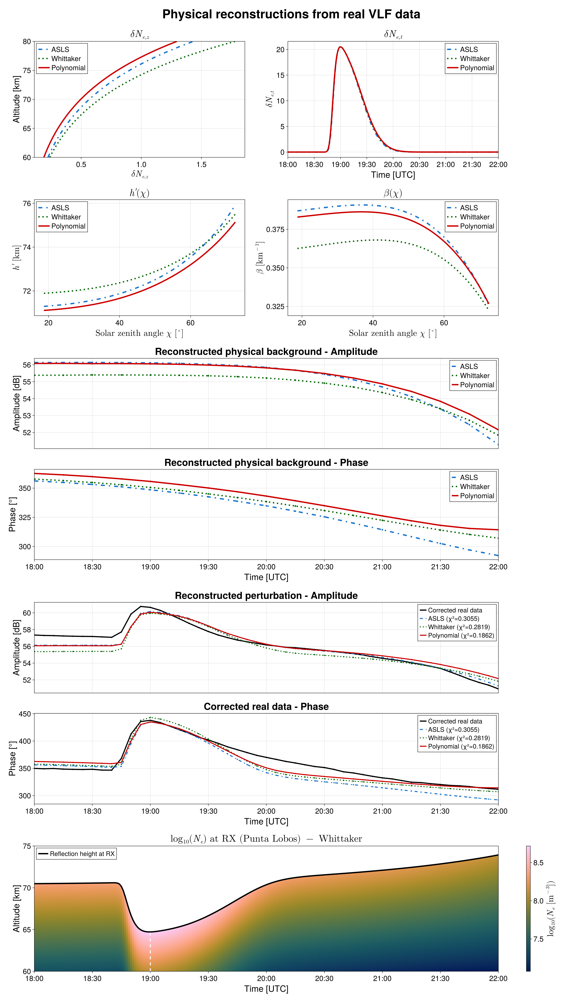

In [15]:
# ============================================================
# 16. Final fused paper figure
# ============================================================
fig = Figure(
    size = (1750, 3000),
    backgroundcolor = :white,
    figure_padding = (22, 28, 20, 20),
)

Label(
    fig[0, 1:3],
    "Physical reconstructions from real VLF data";
    fontsize = FS_TITLE + 8,
    font = :bold,
    halign = :center,
    tellwidth = false,
)

# ------------------------------------------------------------
# Row 1: vertical and temporal perturbation parameterizations
# ------------------------------------------------------------
ax_z = Axis(
    fig[1, 1],
    xlabel = L"\delta N_{e,z}",
    ylabel = "Altitude [km]",
    title = L"\delta N_{e,z}",
    limits = (nothing, (60.0, 80.0)),
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    titlesize = FS_TITLE,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
)

for i in eachindex(METHOD_NAMES)
    lines!(ax_z, vertical_profiles[i], z_grid_km;
        color = METHOD_COLORS[i], linestyle = METHOD_LINESTYLES[i],
        linewidth = LW, label = METHOD_NAMES[i])
end
axislegend(ax_z; position = :lt, labelsize = FS_LEGEND, patchsize = (34, 18),
    framevisible = true, backgroundcolor = (:white, 0.90))

ax_t = Axis(
    fig[1, 2],
    xlabel = "Time [UTC]",
    ylabel = L"\delta N_{e,t}",
    title = L"\delta N_{e,t}",
    xticks = (xticks_hours, xtick_labels),
    limits = (18.0, 22.0, nothing, nothing),
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    titlesize = FS_TITLE,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
)

for i in eachindex(METHOD_NAMES)
    lines!(ax_t, time_hours_utc, temporal_profiles[i];
        color = METHOD_COLORS[i], linestyle = METHOD_LINESTYLES[i],
        linewidth = LW, label = METHOD_NAMES[i])
end
axislegend(ax_t; position = :rt, labelsize = FS_LEGEND, patchsize = (34, 18),
    framevisible = true, backgroundcolor = (:white, 0.90))

# ------------------------------------------------------------
# Row 2: h′(χ) and β(χ)
# ------------------------------------------------------------
ax_h = Axis(
    fig[2, 1],
    xlabel = L"\mathrm{Solar\ zenith\ angle}\ \chi\ [^\circ]",
    ylabel = L"h'\ [\mathrm{km}]",
    title = L"h'(\chi)",
    xlabelsize = FS_LABEL, ylabelsize = FS_LABEL, titlesize = FS_TITLE,
    xticklabelsize = FS_TICK, yticklabelsize = FS_TICK,
)

for i in eachindex(METHOD_NAMES)
    lines!(ax_h, chi_grid_deg, h_chi[i];
        color = METHOD_COLORS[i], linestyle = METHOD_LINESTYLES[i],
        linewidth = LW, label = METHOD_NAMES[i])
end
axislegend(ax_h; position = :lt, labelsize = FS_LEGEND, patchsize = (34, 18),
    framevisible = true, backgroundcolor = (:white, 0.90))

ax_beta = Axis(
    fig[2, 2],
    xlabel = L"\mathrm{Solar\ zenith\ angle}\ \chi\ [^\circ]",
    ylabel = L"\beta\ [\mathrm{km}^{-1}]",
    title = L"\beta(\chi)",
    xlabelsize = FS_LABEL, ylabelsize = FS_LABEL, titlesize = FS_TITLE,
    xticklabelsize = FS_TICK, yticklabelsize = FS_TICK,
)

for i in eachindex(METHOD_NAMES)
    lines!(ax_beta, chi_grid_deg, beta_chi[i];
        color = METHOD_COLORS[i], linestyle = METHOD_LINESTYLES[i],
        linewidth = LW, label = METHOD_NAMES[i])
end
axislegend(ax_beta; position = :rt, labelsize = FS_LEGEND, patchsize = (34, 18),
    framevisible = true, backgroundcolor = (:white, 0.90))

# Common time ticks for rows 3–6.
time_ticks = collect(18.0:0.5:22.0)
time_tick_dt = collect(DateTime(2008, 3, 25, 18, 0, 0):Minute(30):DateTime(2008, 3, 25, 22, 0, 0))
time_tick_labels = Dates.format.(time_tick_dt, "HH:MM")
xticks_common = (time_ticks, time_tick_labels)

# ------------------------------------------------------------
# Row 3: reconstructed physical background — amplitude
# ------------------------------------------------------------
ax_bg_A = Axis(
    fig[3, 1:2],
    title = "Reconstructed physical background - Amplitude",
    ylabel = "Amplitude [dB]",
    xticks = xticks_common,
    limits = ((18.0, 22.0), nothing),
    xticksvisible = false,
    xticklabelsvisible = false,
    xlabelvisible = false,
    titlesize = FS_TITLE,
    ylabelsize = FS_LABEL,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
)

for i in eachindex(METHOD_NAMES)
    lines!(ax_bg_A, t_hours_17, A_model_bg_17[i];
        color = METHOD_COLORS[i], linestyle = METHOD_LINESTYLES[i],
        linewidth = LW, label = METHOD_NAMES[i])
    scatter!(ax_bg_A, t_hours_17, A_model_bg_17[i];
        color = METHOD_COLORS[i], marker = METHOD_MARKERS[i], markersize = 7)
end
axislegend(ax_bg_A; position = :rt, labelsize = FS_LEGEND,
    framevisible = true, backgroundcolor = (:white, 0.90))

# ------------------------------------------------------------
# Row 4: reconstructed physical background — phase
# ------------------------------------------------------------
ax_bg_phi = Axis(
    fig[4, 1:2],
    title = "Reconstructed physical background - Phase",
    xlabel = "Time [UTC]",
    ylabel = "Phase [°]",
    xticks = xticks_common,
    limits = ((18.0, 22.0), nothing),
    titlesize = FS_TITLE,
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
)

for i in eachindex(METHOD_NAMES)
    lines!(ax_bg_phi, t_hours_17, phi_model_bg_17[i];
        color = METHOD_COLORS[i], linestyle = METHOD_LINESTYLES[i],
        linewidth = LW, label = METHOD_NAMES[i])
    scatter!(ax_bg_phi, t_hours_17, phi_model_bg_17[i];
        color = METHOD_COLORS[i], marker = METHOD_MARKERS[i], markersize = 7)
end
axislegend(ax_bg_phi; position = :rt, labelsize = FS_LEGEND,
    framevisible = true, backgroundcolor = (:white, 0.90))
linkxaxes!(ax_bg_A, ax_bg_phi)

# ------------------------------------------------------------
# Row 5: reconstructed perturbation — amplitude
# ------------------------------------------------------------
ax_pert_A = Axis(
    fig[5, 1:2],
    title = "Reconstructed perturbation - Amplitude",
    ylabel = "Amplitude [dB]",
    xticks = xticks_common,
    limits = ((18.0, 22.0), nothing),
    xticksvisible = false,
    xticklabelsvisible = false,
    xlabelvisible = false,
    titlesize = FS_TITLE,
    ylabelsize = FS_LABEL,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
)

lines!(ax_pert_A, poly_time_5min.hours, A_data_5min;
    color = :black, linewidth = 3.4, label = "Corrected real data")
scatter!(ax_pert_A, poly_time_5min.hours, A_data_5min;
    color = :black, markersize = 6)

for i in eachindex(METHOD_NAMES)
    lines!(ax_pert_A, poly_time_5min.hours, A_models_5min[i];
        color = METHOD_COLORS[i], linestyle = METHOD_LINESTYLES[i],
        linewidth = 3.0, label = perturbation_labels[i])
    scatter!(ax_pert_A, poly_time_5min.hours, A_models_5min[i];
        color = METHOD_COLORS[i], marker = METHOD_MARKERS[i], markersize = 5.5)
end
axislegend(ax_pert_A; position = :rt, labelsize = FS_LEGEND - 2,
    framevisible = true, backgroundcolor = (:white, 0.90))

# ------------------------------------------------------------
# Row 6: reconstructed perturbation — phase
# ------------------------------------------------------------
ax_pert_phi = Axis(
    fig[6, 1:2],
    title = "Corrected real data - Phase",
    xlabel = "Time [UTC]",
    ylabel = "Phase [°]",
    xticks = xticks_common,
    limits = ((18.0, 22.0), nothing),
    titlesize = FS_TITLE,
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
)

lines!(ax_pert_phi, poly_time_5min.hours, phi_data_5min;
    color = :black, linewidth = 3.4, label = "Corrected real data")
scatter!(ax_pert_phi, poly_time_5min.hours, phi_data_5min;
    color = :black, markersize = 6)

for i in eachindex(METHOD_NAMES)
    lines!(ax_pert_phi, poly_time_5min.hours, phi_models_5min[i];
        color = METHOD_COLORS[i], linestyle = METHOD_LINESTYLES[i],
        linewidth = 3.0, label = perturbation_labels[i])
    scatter!(ax_pert_phi, poly_time_5min.hours, phi_models_5min[i];
        color = METHOD_COLORS[i], marker = METHOD_MARKERS[i], markersize = 5.5)
end
axislegend(ax_pert_phi; position = :rt, labelsize = FS_LEGEND - 2,
    framevisible = true, backgroundcolor = (:white, 0.90))
linkxaxes!(ax_pert_A, ax_pert_phi)

# ------------------------------------------------------------
# Row 7: Whittaker electron-density field at RX
# ------------------------------------------------------------
ax_map = Axis(
    fig[7, 1:2],
    xlabel = "Time [UTC]",
    ylabel = "Altitude [km]",
    title = L"\log_{10}(N_e)\ \mathrm{at\ RX\ (Punta\ Lobos)}\ -\ \mathrm{Whittaker}",
    xticks = (xticks_hours, xtick_labels),
    limits = (18.0, 22.0, 60.0, 75.0),
    xlabelsize = FS_LABEL,
    ylabelsize = FS_LABEL,
    titlesize = FS_TITLE,
    xticklabelsize = FS_TICK,
    yticklabelsize = FS_TICK,
    xgridvisible = false,
    ygridvisible = false,
)

hm = heatmap!(
    ax_map,
    time_hours_utc,
    z_grid_km,
    logNe_whit_masked;
    colormap = :batlow,
    colorrange = masked_colorrange,
    nan_color = :white,
)

vlines!(ax_map, [t_pk_hour_utc]; color = (:white, 0.95), linestyle = :dash, linewidth = 3)
lines!(ax_map, time_hours_utc, reflection_height_rx_whit_km;
    color = :black, linewidth = 4, label = "Reflection height at RX")
axislegend(ax_map; position = :lt, labelsize = FS_LEGEND - 2,
    patchsize = (30, 16), framevisible = true, backgroundcolor = (:white, 0.90))

Colorbar(
    fig[7, 3],
    hm;
    label = L"\log_{10}(N_e\ [\mathrm{m}^{-3}])",
    labelsize = FS_LABEL,
    ticklabelsize = FS_TICK,
)

colgap!(fig.layout, 30)
rowgap!(fig.layout, 24)
colsize!(fig.layout, 1, CairoMakie.Auto(1))
colsize!(fig.layout, 2, CairoMakie.Auto(1))
colsize!(fig.layout, 3, CairoMakie.Fixed(120))

rowsize!(fig.layout, 1, CairoMakie.Auto(1.00))
rowsize!(fig.layout, 2, CairoMakie.Auto(1.00))
rowsize!(fig.layout, 3, CairoMakie.Auto(0.78))
rowsize!(fig.layout, 4, CairoMakie.Auto(0.78))
rowsize!(fig.layout, 5, CairoMakie.Auto(0.78))
rowsize!(fig.layout, 6, CairoMakie.Auto(0.78))
rowsize!(fig.layout, 7, CairoMakie.Auto(1.08))

save(output_pdf, fig)
save(output_png, fig; px_per_unit = 2)

println("Saved: ", output_pdf)
println("Saved: ", output_png)

fig


## Output and interpretation

The fused figure preserves the same scientific ordering as the synthetic-data counterpart. The upper rows compare the three physically reconstructed parameter families. The middle rows show what those reconstructions imply for the unperturbed and perturbed received VLF signals. The lower panel gives the Whittaker physical $N_e(z,t)$ realization, with the same reflection-height diagnostic used in the original Figure 10.


Saved real-data Figure 1:
  /home/jp/basefolder_JP/real_3families_separate_figures/real-data-parameters-density-whittaker.pdf
  /home/jp/basefolder_JP/real_3families_separate_figures/real-data-parameters-density-whittaker.png

Saved real-data Figure 2:
  /home/jp/basefolder_JP/real_3families_separate_figures/real-data-electric-field.pdf
  /home/jp/basefolder_JP/real_3families_separate_figures/real-data-electric-field.png


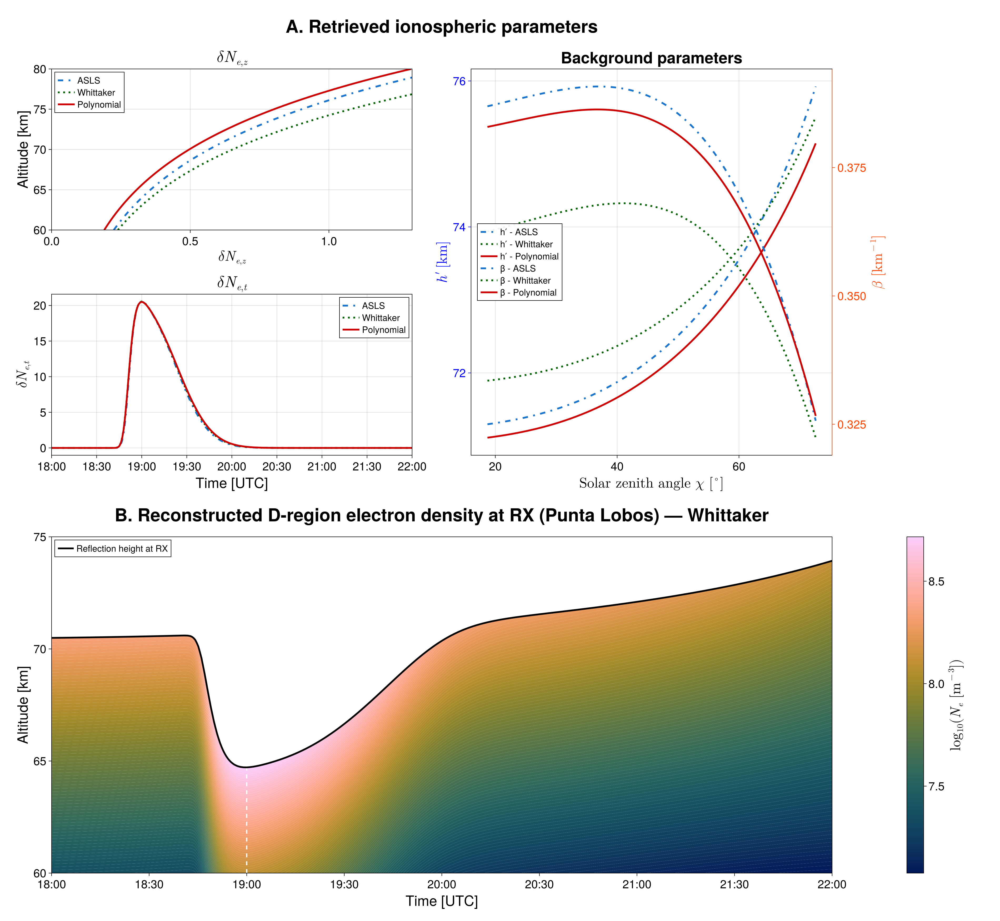

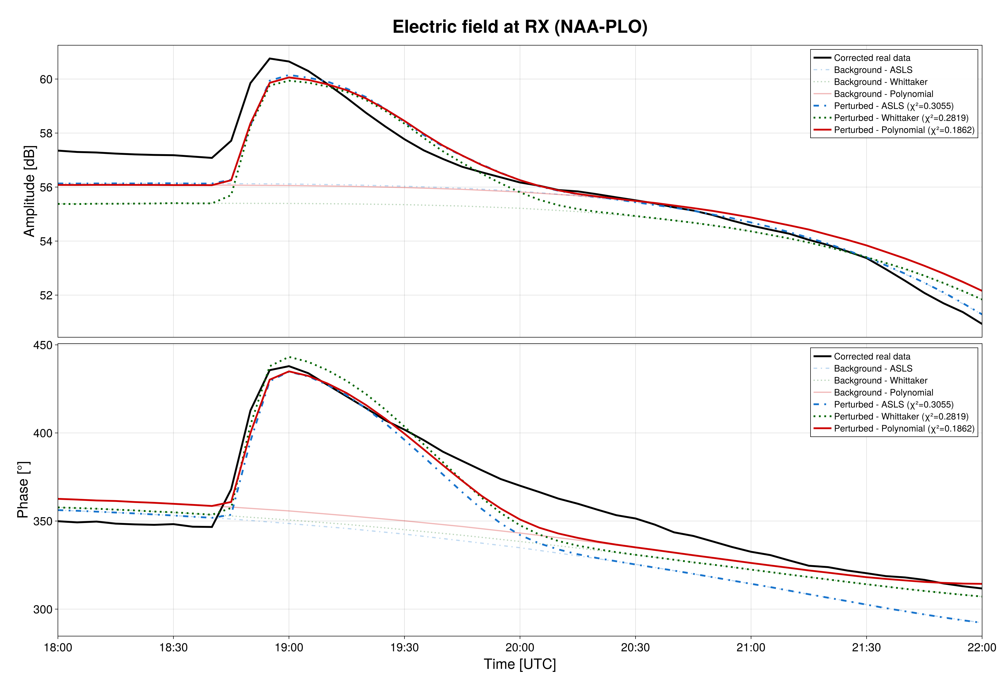

CairoMakie.Screen{IMAGE}


In [19]:
# ============================================================
# TWO SEPARATE FIGURES — REAL DATA
#
# FIGURE 1:
#   A. Retrieved ionospheric parameters
#      left:  δNe,z / δNe,t
#      right: h′(χ) + β(χ)
#
#   B. Reconstructed D-region electron density at RX
#      Whittaker realization
#
# FIGURE 2:
#   Electric field at RX
#      top    -> Amplitude: background + perturbed field + data
#      bottom -> Phase:     background + perturbed field + data
#
# Uses ONLY quantities already computed by this notebook.
# No inversion or LMP propagation is rerun.
# ============================================================


# ============================================================
# Typography and styles
# ============================================================

FS_TICK_R   = 22
FS_LABEL_R  = 27
FS_TITLE_R  = 30
FS_PANEL_R  = 34
FS_LEGEND_R = 17

LW_MAIN_R = 3.4
LW_BG_R   = 2.3
LW_DATA_R = 3.6

BG_ALPHA_R = 0.28

# h′ and β axis colors
H_AXIS_COLOR_R    = :blue
BETA_AXIS_COLOR_R = :orangered

# Colorbar geometry
CBAR_WIDTH_R = 32
CBAR_GAP_R   = 8
CBAR_COL_W_R = 100


# ============================================================
# Theme
# ============================================================

set_theme!(Theme(

    fontsize = FS_LABEL_R,

    Axis = (
        xticklabelsize = FS_TICK_R,
        yticklabelsize = FS_TICK_R,

        xlabelsize = FS_LABEL_R,
        ylabelsize = FS_LABEL_R,

        titlesize = FS_TITLE_R,
        titlefont = :bold,

        xgridvisible = true,
        ygridvisible = true,

        xgridcolor = RGBAf(0, 0, 0, 0.13),
        ygridcolor = RGBAf(0, 0, 0, 0.13),

        backgroundcolor = :white,
    ),

    Legend = (
        labelsize = FS_LEGEND_R,

        framevisible = true,
        framecolor = :black,

        backgroundcolor = (:white, 0.93),
    ),

    Colorbar = (
        ticklabelsize = FS_TICK_R,
        labelsize = FS_LABEL_R,
    ),
))


# ============================================================
# Common time axis
# ============================================================

time_ticks_R = collect(18.0:0.5:22.0)

time_tick_dt_R = collect(
    DateTime(2008, 3, 25, 18, 0):
    Minute(30):
    DateTime(2008, 3, 25, 22, 0)
)

time_tick_labels_R =
    Dates.format.(time_tick_dt_R, "HH:MM")

xticks_R = (
    time_ticks_R,
    time_tick_labels_R,
)

XMIN_R = 18.0
XMAX_R = 22.0


# ============================================================
# Sanity checks for quantities used below
# ============================================================

@assert length(METHOD_NAMES) == 3
@assert length(METHOD_COLORS) == 3
@assert length(METHOD_LINESTYLES) == 3
@assert length(METHOD_MARKERS) == 3

@assert length(vertical_profiles) == 3
@assert length(temporal_profiles) == 3
@assert length(h_chi) == 3
@assert length(beta_chi) == 3

@assert length(A_model_bg_17) == 3
@assert length(phi_model_bg_17) == 3

@assert length(A_models_5min) == 3
@assert length(phi_models_5min) == 3

@assert nrow(metrics_perturbation_5min) == 3


# ============================================================
# χ² strings for the perturbed-field fits
#
# These are the total normalized χ² values already recomputed
# and audited against the original Figure 9.
# ============================================================

chi2_total_R = Float64.(
    metrics_perturbation_5min.chi2_total
)

pert_labels_R = [
    @sprintf(
        "%s (χ²=%.4f)",
        METHOD_NAMES[i],
        chi2_total_R[i],
    )
    for i in eachindex(METHOD_NAMES)
]


# ============================================================
# Prepare smooth Whittaker electron-density representation
#
# Visualization only.
# No physical model is recomputed.
# ============================================================

time_density_R =
    collect(Float64.(time_hours_utc))

z_density_R =
    collect(Float64.(z_grid_km))

logNe_density_R =
    Array{Float64}(logNe_whit)

refheight_density_R =
    collect(Float64.(reflection_height_rx_whit_km))


@assert size(logNe_density_R, 1) == length(time_density_R)
@assert size(logNe_density_R, 2) == length(z_density_R)

@assert length(refheight_density_R) ==
        length(time_density_R)


# ------------------------------------------------------------
# Fine visualization grid
# ------------------------------------------------------------

N_TIME_FINE_R = 501
N_ALT_FINE_R  = 401

time_density_fine_R = collect(
    range(
        first(time_density_R),
        last(time_density_R);
        length = N_TIME_FINE_R,
    )
)

z_density_fine_R = collect(
    range(
        first(z_density_R),
        last(z_density_R);
        length = N_ALT_FINE_R,
    )
)


# ------------------------------------------------------------
# Interpolate log10(Ne)
# ------------------------------------------------------------

logNe_itp_R = Interpolations.interpolate(

    (
        time_density_R,
        z_density_R,
    ),

    logNe_density_R,

    Interpolations.Gridded(
        Interpolations.Linear(),
    ),
)


logNe_fine_R = [

    logNe_itp_R(t, z)

    for t in time_density_fine_R,
        z in z_density_fine_R
]


# ------------------------------------------------------------
# Interpolate physical reflection height
# ------------------------------------------------------------

refheight_itp_R = Interpolations.interpolate(

    (
        time_density_R,
    ),

    refheight_density_R,

    Interpolations.Gridded(
        Interpolations.Linear(),
    ),
)


refheight_fine_R = [

    refheight_itp_R(t)

    for t in time_density_fine_R
]


# ------------------------------------------------------------
# Color range only from physically visible region
# ------------------------------------------------------------

visible_logNe_R = Float64[]


for i in eachindex(time_density_fine_R)

    h_ref = refheight_fine_R[i]

    for j in eachindex(z_density_fine_R)

        if z_density_fine_R[j] <= h_ref

            push!(
                visible_logNe_R,
                logNe_fine_R[i, j],
            )

        end

    end

end


@assert !isempty(visible_logNe_R)

@assert all(
    isfinite,
    visible_logNe_R,
)


colorrange_density_R =
    extrema(visible_logNe_R)


N_CONTOUR_LEVELS_R = 128

contour_levels_density_R = collect(
    range(
        colorrange_density_R[1],
        colorrange_density_R[2];
        length = N_CONTOUR_LEVELS_R,
    )
)


# ============================================================
# ============================================================
# FIGURE 1
#
# Physical parameters + Whittaker Ne(z,t)
# ============================================================
# ============================================================

fig_real_AC = Figure(

    size = (1900, 1750),

    backgroundcolor = :white,

    figure_padding = (28, 34, 24, 22),
)


layout_real_AC = GridLayout()

fig_real_AC[1, 1] =
    layout_real_AC


# ============================================================
# FIGURE 1 — PANEL A TITLE
# ============================================================

Label(

    layout_real_AC[1, 1],

    "A. Retrieved ionospheric parameters";

    fontsize = FS_PANEL_R,

    font = :bold,

    halign = :center,

    tellwidth = false,

    padding = (0, 0, 4, 8),
)


# ============================================================
# FIGURE 1 — PARAMETER BLOCK
# ============================================================

parameters_layout_R = GridLayout()

layout_real_AC[2, 1] =
    parameters_layout_R


left_parameters_R = GridLayout()

parameters_layout_R[1, 1] =
    left_parameters_R


# ============================================================
# δNe,z
# ============================================================

ax_R_z = Axis(

    left_parameters_R[1, 1];

    alignmode = Inside(),

    title = L"\delta N_{e,z}",

    xlabel = L"\delta N_{e,z}",

    ylabel = "Altitude [km]",

    limits = (
        #nothing,
        (0.0, 1.3),
        (60.0, 80.0),
    ),
)


for i in eachindex(METHOD_NAMES)

    lines!(
        ax_R_z,
        vertical_profiles[i],
        z_grid_km;

        color = METHOD_COLORS[i],

        linestyle = METHOD_LINESTYLES[i],

        linewidth = LW_MAIN_R,

        label = METHOD_NAMES[i],
    )

end


axislegend(

    ax_R_z;

    position = :lt,

    labelsize = FS_LEGEND_R,

    patchsize = (32, 16),

    framevisible = true,

    backgroundcolor = (:white, 0.93),
)


# ============================================================
# δNe,t
# ============================================================

ax_R_t = Axis(

    left_parameters_R[2, 1];

    alignmode = Inside(),

    title = L"\delta N_{e,t}",

    xlabel = "Time [UTC]",

    ylabel = L"\delta N_{e,t}",

    xticks = xticks_R,

    limits = (
        (XMIN_R, XMAX_R),
        nothing,
    ),
)


for i in eachindex(METHOD_NAMES)

    lines!(
        ax_R_t,
        time_hours_utc,
        temporal_profiles[i];

        color = METHOD_COLORS[i],

        linestyle = METHOD_LINESTYLES[i],

        linewidth = LW_MAIN_R,

        label = METHOD_NAMES[i],
    )

end


axislegend(

    ax_R_t;

    position = :rt,

    labelsize = FS_LEGEND_R,

    patchsize = (32, 16),

    framevisible = true,

    backgroundcolor = (:white, 0.93),
)


rowgap!(
    left_parameters_R,
    18,
)


# ============================================================
# h′(χ) + β(χ)
#
# Method:
#   color + line style
#
# Quantity:
#   h′   -> lines only
#   β    -> lines + markers
#
# This avoids making h′ and β visually indistinguishable.
# ============================================================

ax_R_h = Axis(

    parameters_layout_R[1, 2];

    alignmode = Inside(),

    title = "Background parameters",

    xlabel =
        L"\mathrm{Solar\ zenith\ angle}\ \chi\ [^\circ]",

    ylabel =
        L"h'\ [\mathrm{km}]",

    ylabelcolor = H_AXIS_COLOR_R,

    yticklabelcolor = H_AXIS_COLOR_R,

    ytickcolor = H_AXIS_COLOR_R,

    leftspinecolor = H_AXIS_COLOR_R,
)


ax_R_beta = Axis(

    parameters_layout_R[1, 2];

    alignmode = Inside(),

    backgroundcolor = :transparent,

    yaxisposition = :right,

    ylabel =
        L"\beta\ [\mathrm{km}^{-1}]",

    ylabelcolor = BETA_AXIS_COLOR_R,

    yticklabelcolor = BETA_AXIS_COLOR_R,

    ytickcolor = BETA_AXIS_COLOR_R,

    rightspinecolor = BETA_AXIS_COLOR_R,

    xgridvisible = false,

    ygridvisible = false,
)


linkxaxes!(
    ax_R_h,
    ax_R_beta,
)


hidexdecorations!(
    ax_R_beta,
)


# ------------------------------------------------------------
# Handles for the combined legend
# ------------------------------------------------------------

h_handles_R = Any[]
beta_handles_R = Any[]


for i in eachindex(METHOD_NAMES)

    h_i = lines!(

        ax_R_h,
        chi_grid_deg,
        h_chi[i];

        color = METHOD_COLORS[i],

        linestyle = METHOD_LINESTYLES[i],

        linewidth = LW_MAIN_R,
    )

    push!(
        h_handles_R,
        h_i,
    )


    beta_i = scatterlines!(

        ax_R_beta,
        chi_grid_deg,
        beta_chi[i];

        color = METHOD_COLORS[i],

        linestyle = METHOD_LINESTYLES[i],

        linewidth = LW_MAIN_R,

        marker = METHOD_MARKERS[i],

        # Keep markers restrained because chi_grid has 400 points.
        markersize = 0,
    )

    push!(
        beta_handles_R,
        beta_i,
    )

end


# ============================================================
# h′ / β legend
#
# Middle-left as requested for the synthetic counterpart.
# ============================================================

Legend(

    parameters_layout_R[1, 2],

    vcat(
        h_handles_R,
        beta_handles_R,
    ),

    vcat(
        [
            "h′ - $(METHOD_NAMES[i])"
            for i in eachindex(METHOD_NAMES)
        ],

        [
            "β - $(METHOD_NAMES[i])"
            for i in eachindex(METHOD_NAMES)
        ],
    );

    tellwidth = false,

    tellheight = false,

    halign = :left,

    valign = :center,

    margin = (12, 8, 8, 8),

    patchsize = (32, 16),
)


# ------------------------------------------------------------
# Parameter-block geometry
# ------------------------------------------------------------

colgap!(
    parameters_layout_R,
    42,
)


colsize!(
    parameters_layout_R,
    1,
    Auto(1),
)


colsize!(
    parameters_layout_R,
    2,
    Auto(1),
)


# ============================================================
# FIGURE 1 — PANEL B TITLE
# ============================================================

Label(

    layout_real_AC[3, 1],

    "B. Reconstructed D-region electron density at RX (Punta Lobos) — Whittaker";

    fontsize = FS_PANEL_R,

    font = :bold,

    halign = :center,

    tellwidth = false,

    padding = (0, 0, 4, 8),
)


# ============================================================
# FIGURE 1 — ELECTRON DENSITY
# ============================================================

ax_R_density = Axis(

    layout_real_AC[4, 1];

    alignmode = Inside(),

    xlabel = "Time [UTC]",

    ylabel = "Altitude [km]",

    xticks = xticks_R,

    limits = (
        XMIN_R,
        XMAX_R,

        60.0,
        75.0,
    ),

    xgridvisible = false,

    ygridvisible = false,
)


contour_R = contourf!(

    ax_R_density,

    time_density_fine_R,
    z_density_fine_R,
    logNe_fine_R;

    levels = contour_levels_density_R,

    colormap = :batlow,
)


# ------------------------------------------------------------
# Flare peak
# ------------------------------------------------------------

vlines!(

    ax_R_density,

    [t_pk_hour_utc];

    color = (:white, 0.95),

    linestyle = :dash,

    linewidth = 2.5,
)


# ------------------------------------------------------------
# Smooth mask above physical reflection height
# ------------------------------------------------------------

mask_top_km_R = 75.2

mask_points_R = Point2f[]


for i in eachindex(time_density_fine_R)

    push!(
        mask_points_R,

        Point2f(
            time_density_fine_R[i],
            refheight_fine_R[i],
        ),
    )

end


push!(
    mask_points_R,

    Point2f(
        last(time_density_fine_R),
        mask_top_km_R,
    ),
)


push!(
    mask_points_R,

    Point2f(
        first(time_density_fine_R),
        mask_top_km_R,
    ),
)


poly!(

    ax_R_density,

    mask_points_R;

    color = :white,

    strokewidth = 0,
)


# ------------------------------------------------------------
# Physical reflection height
# ------------------------------------------------------------

lines!(

    ax_R_density,

    time_density_fine_R,
    refheight_fine_R;

    color = :black,

    linewidth = 3.3,

    label = "Reflection height at RX",
)


axislegend(

    ax_R_density;

    position = :lt,

    labelsize = FS_LEGEND_R,

    patchsize = (30, 16),
)


# ------------------------------------------------------------
# Colorbar
# ------------------------------------------------------------

Colorbar(

    layout_real_AC[4, 2],

    contour_R;

    label =
        L"\log_{10}(N_e\ [\mathrm{m}^{-3}])",

    labelsize = FS_LABEL_R,

    ticklabelsize = FS_TICK_R,

    width = CBAR_WIDTH_R,
)


# ------------------------------------------------------------
# Figure 1 geometry
# ------------------------------------------------------------

colgap!(
    layout_real_AC,
    CBAR_GAP_R,
)


colsize!(
    layout_real_AC,
    1,
    Auto(1),
)


colsize!(
    layout_real_AC,
    2,
    Fixed(CBAR_COL_W_R),
)


rowgap!(
    layout_real_AC,
    18,
)


rowsize!(
    layout_real_AC,
    2,
    Auto(1.15),
)


rowsize!(
    layout_real_AC,
    4,
    Auto(1.00),
)


# ============================================================
# ============================================================
# FIGURE 2
#
# ELECTRIC FIELD AT RX
# ============================================================
# ============================================================

fig_real_E = Figure(

    size = (1900, 1300),

    backgroundcolor = :white,

    figure_padding = (28, 34, 24, 22),
)


layout_real_E = GridLayout()

fig_real_E[1, 1] =
    layout_real_E


# ============================================================
# FIGURE 2 TITLE
# ============================================================

Label(

    layout_real_E[1, 1],

    "Electric field at RX (NAA-PLO)";

    fontsize = FS_PANEL_R,

    font = :bold,

    halign = :center,

    tellwidth = false,

    padding = (0, 0, 4, 8),
)


# ============================================================
# FIGURE 2 — AMPLITUDE
# ============================================================

ax_R_A = Axis(

    layout_real_E[2, 1];

    alignmode = Inside(),

    ylabel = "Amplitude [dB]",

    xticks = xticks_R,

    limits = (
        (XMIN_R, XMAX_R),
        nothing,
    ),

    # Only the lower phase panel shows X labels.
    xticklabelsvisible = false,

    xticksvisible = false,

    xlabelvisible = false,
)


# ------------------------------------------------------------
# Corrected real-data amplitude
# ------------------------------------------------------------

data_A_handle_R = lines!(

    ax_R_A,

    poly_time_5min.hours,
    A_data_5min;

    color = :black,

    linewidth = LW_DATA_R,
)


# ============================================================
# Background amplitude
# ============================================================

bg_A_handles_R = Any[]


for i in eachindex(METHOD_NAMES)

    handle = lines!(

        ax_R_A,

        t_hours_17,
        A_model_bg_17[i];

        color = (
            METHOD_COLORS[i],
            BG_ALPHA_R,
        ),

        linestyle =
            METHOD_LINESTYLES[i],

        linewidth = LW_BG_R,
    )

    push!(
        bg_A_handles_R,
        handle,
    )

end


# ============================================================
# Perturbed amplitude
# ============================================================

pert_A_handles_R = Any[]


for i in eachindex(METHOD_NAMES)

    handle = lines!(

        ax_R_A,

        poly_time_5min.hours,
        A_models_5min[i];

        color = METHOD_COLORS[i],

        linestyle =
            METHOD_LINESTYLES[i],

        linewidth = LW_MAIN_R,
    )

    push!(
        pert_A_handles_R,
        handle,
    )

end


# ============================================================
# AMPLITUDE LEGEND
# ============================================================

Legend(

    layout_real_E[2, 1],

    vcat(
        [data_A_handle_R],
        bg_A_handles_R,
        pert_A_handles_R,
    ),

    vcat(
        ["Corrected real data"],

        [
            "Background - $(METHOD_NAMES[i])"
            for i in eachindex(METHOD_NAMES)
        ],

        [
            "Perturbed - $(pert_labels_R[i])"
            for i in eachindex(METHOD_NAMES)
        ],
    );

    tellwidth = false,

    tellheight = false,

    halign = :right,

    valign = :top,

    margin = (8, 8, 8, 8),

    patchsize = (34, 16),

    labelsize = FS_LEGEND_R,
)


# ============================================================
# FIGURE 2 — PHASE
# ============================================================

ax_R_phi = Axis(

    layout_real_E[3, 1];

    alignmode = Inside(),

    xlabel = "Time [UTC]",

    ylabel = "Phase [°]",

    xticks = xticks_R,

    limits = (
        (XMIN_R, XMAX_R),
        nothing,
    ),
)


# ------------------------------------------------------------
# Corrected real-data phase
# ------------------------------------------------------------

data_phi_handle_R = lines!(

    ax_R_phi,

    poly_time_5min.hours,
    phi_data_5min;

    color = :black,

    linewidth = LW_DATA_R,
)


# ============================================================
# Background phase
# ============================================================

bg_phi_handles_R = Any[]


for i in eachindex(METHOD_NAMES)

    handle = lines!(

        ax_R_phi,

        t_hours_17,
        phi_model_bg_17[i];

        color = (
            METHOD_COLORS[i],
            BG_ALPHA_R,
        ),

        linestyle =
            METHOD_LINESTYLES[i],

        linewidth = LW_BG_R,
    )

    push!(
        bg_phi_handles_R,
        handle,
    )

end


# ============================================================
# Perturbed phase
# ============================================================

pert_phi_handles_R = Any[]


for i in eachindex(METHOD_NAMES)

    handle = lines!(

        ax_R_phi,

        poly_time_5min.hours,
        phi_models_5min[i];

        color = METHOD_COLORS[i],

        linestyle =
            METHOD_LINESTYLES[i],

        linewidth = LW_MAIN_R,
    )

    push!(
        pert_phi_handles_R,
        handle,
    )

end


# ============================================================
# PHASE LEGEND
# ============================================================

Legend(

    layout_real_E[3, 1],

    vcat(
        [data_phi_handle_R],
        bg_phi_handles_R,
        pert_phi_handles_R,
    ),

    vcat(
        ["Corrected real data"],

        [
            "Background - $(METHOD_NAMES[i])"
            for i in eachindex(METHOD_NAMES)
        ],

        [
            "Perturbed - $(pert_labels_R[i])"
            for i in eachindex(METHOD_NAMES)
        ],
    );

    tellwidth = false,

    tellheight = false,

    halign = :right,

    valign = :top,

    margin = (8, 8, 8, 8),

    patchsize = (34, 16),

    labelsize = FS_LEGEND_R,
)


# ============================================================
# TRUE share-X inside Figure 2
# ============================================================

linkxaxes!(
    ax_R_A,
    ax_R_phi,
)


xlims!(
    ax_R_A,
    XMIN_R,
    XMAX_R,
)


rowgap!(
    layout_real_E,
    12,
)


rowsize!(
    layout_real_E,
    2,
    Auto(1),
)


rowsize!(
    layout_real_E,
    3,
    Auto(1),
)


# ============================================================
# EXPORT BOTH FIGURES
# ============================================================

OUTDIR_REAL_SEPARATE = joinpath(
    pwd(),
    "real_3families_separate_figures",
)

mkpath(
    OUTDIR_REAL_SEPARATE,
)


output_real_AC_pdf = joinpath(
    OUTDIR_REAL_SEPARATE,
    "real-data-parameters-density-whittaker.pdf",
)

output_real_AC_png = joinpath(
    OUTDIR_REAL_SEPARATE,
    "real-data-parameters-density-whittaker.png",
)


output_real_E_pdf = joinpath(
    OUTDIR_REAL_SEPARATE,
    "real-data-electric-field.pdf",
)

output_real_E_png = joinpath(
    OUTDIR_REAL_SEPARATE,
    "real-data-electric-field.png",
)


save(
    output_real_AC_pdf,
    fig_real_AC,
)

save(
    output_real_AC_png,
    fig_real_AC;
    px_per_unit = 2,
)


save(
    output_real_E_pdf,
    fig_real_E,
)

save(
    output_real_E_png,
    fig_real_E;
    px_per_unit = 2,
)


println("Saved real-data Figure 1:")
println("  ", output_real_AC_pdf)
println("  ", output_real_AC_png)

println()

println("Saved real-data Figure 2:")
println("  ", output_real_E_pdf)
println("  ", output_real_E_png)


display(fig_real_AC)
display(fig_real_E)